# Ejemplo de manipulación de archivos de audio

## 1. Operaciones básicas con audio

### <span style="color:RoyalBlue">Reproducción de un archivo de audio</span> 

Para cargar y reproducir desde una Notebook de Jupyter un archivo de audio simplemente se puede emplear el widget correspondiente de la siguiente manera:

In [4]:
import IPython.display as ipd

ipd.Audio('track1.mp3')


### <span style="color:RoyalBlue">Lectura de archivo de audio</span> 

Para cargar y graficar la forma de onda de un archivo de audio en primer lugar cargamos las bibliotecas necesarias:

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from numpy.fft import fft, ifft
%matplotlib inline


Una de las formas básicas de leer y escribir un archivo en formato wav es usar scipy.io.wavefile.

En el caso que se trate de una grabación estéreo, conteniendo un canal izquierdo y otro derecho, se puede usar el indexado convencional de Numpy para separar los canales:

In [6]:
frecuencia_muestreo, data = wavfile.read('./testStereo.wav')

duracion = data.shape[0] / frecuencia_muestreo
canal_izquierdo = data[:,0]
canal_derecho = data[:,1]

print(f"Número de canales: {data.shape[1]}")
print("Frecuencia de Muestreo:", frecuencia_muestreo)
print(f"Duración: {duracion}s")

Número de canales: 2
Frecuencia de Muestreo: 48000
Duración: 10.5s


Para conocer la resolución de cuantización de las señales, la librería que estamos usando no tiene un método previsto. Se debe averiguar de manera indirecta a partir del tipo de datos con el que convierte al array de Numpy usando la tabla de la [documentación](https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.wavfile.read.html#r7015bff88555-1)

In [7]:
print(canal_izquierdo.dtype)

int16


Como vemos en este caso la profundidad en bits sería de tipo 16-bit integer PCM.

Sin embargo este método algunas veces genera resultados ambiguos.

### <span style="color:RoyalBlue">Visualización de las señales de audio</span>

Una vez que tenemos cargada la señal de audio en un arreglo, para la graficación se usa la rutina vista en ejemplos previos:

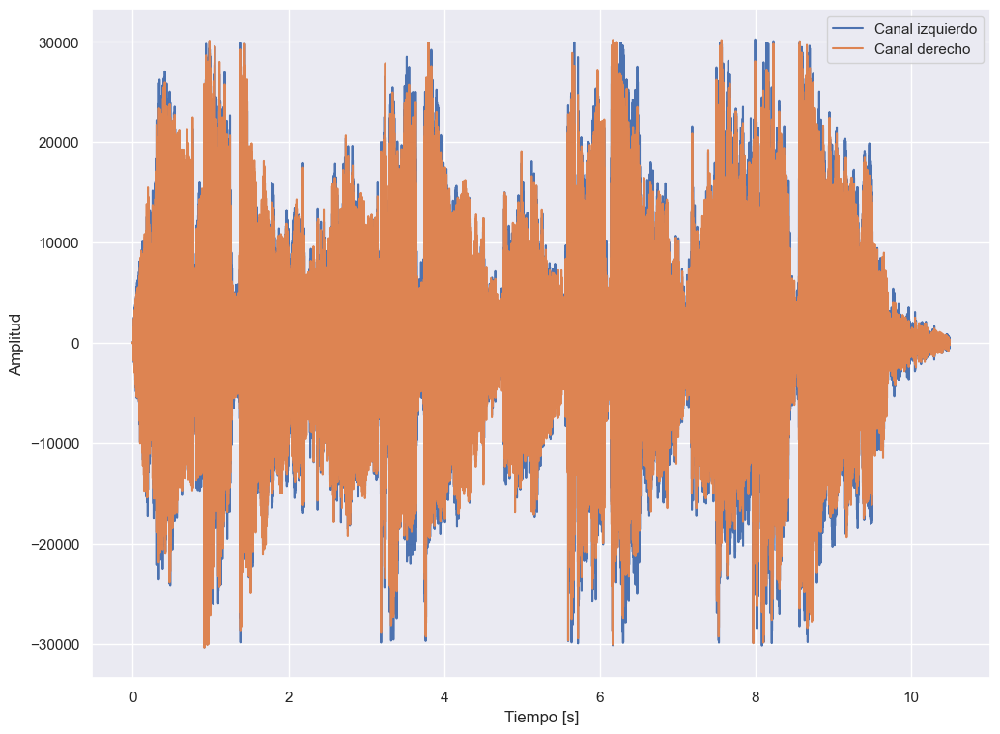

In [8]:
import seaborn as sns
sns.set()
fig = plt.figure(figsize =(12, 9))

tiempo = np.linspace(0., duracion, data.shape[0])

plt.plot(tiempo, canal_izquierdo, label="Canal izquierdo")
plt.plot(tiempo, canal_derecho, label="Canal derecho")

plt.legend()
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.show()

### <span style="color:RoyalBlue">Visualización de espectrogramas</span>

Un espectrograma es una representación visual del espectro de frecuencias que contiene una señal variante en el tiempo. Se calcula estimando las sucesiones del espectro de la señal por ventanas temporales de análisis.

In [9]:
# Hacer en la terminal de Anaconda conda install -c conda-forge librosa
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa
import librosa.display
%matplotlib inline

Vibrato


C:\Users\Diego\AppData\Local\Temp\ipykernel_5324\4037495397.py:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 1)
C:\Users\Diego\AppData\Local\Temp\ipykernel_5324\4037495397.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,2)


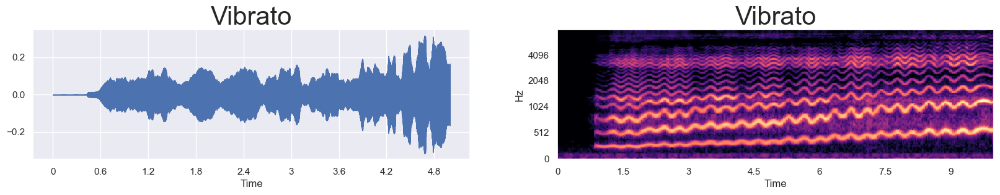

Straight


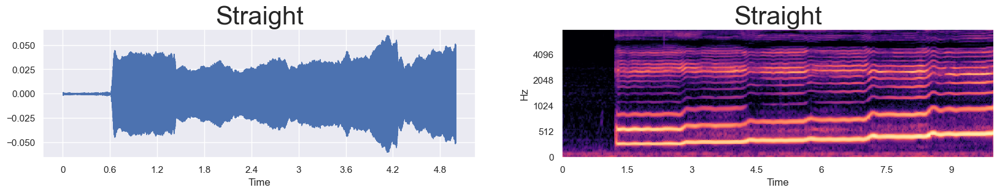

Breathy


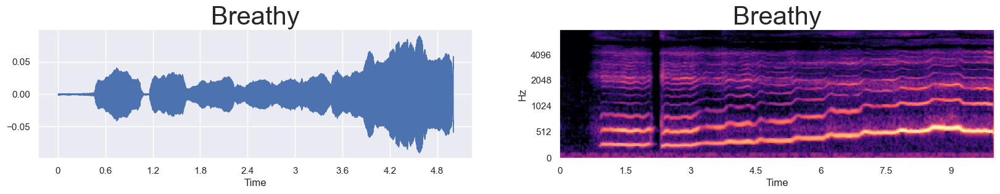

Vocal Fry


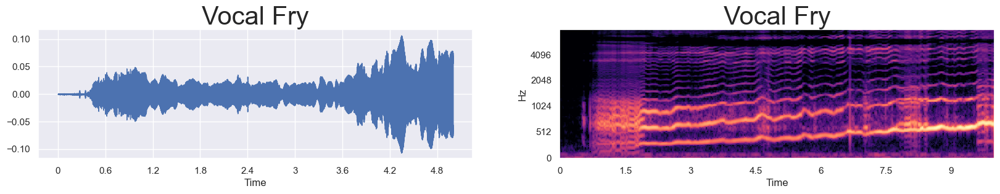

Lip Trill


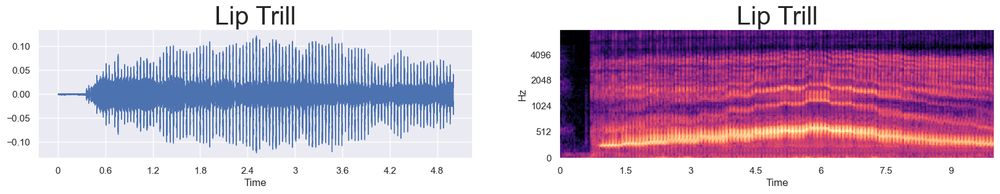

Trill


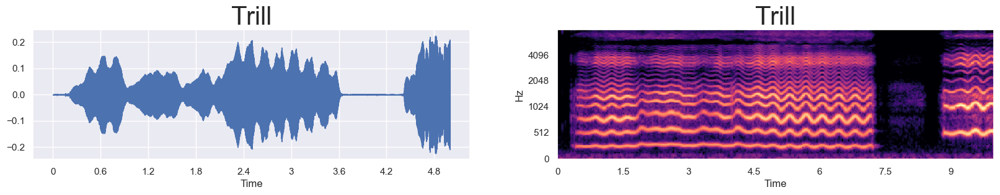

Trillo


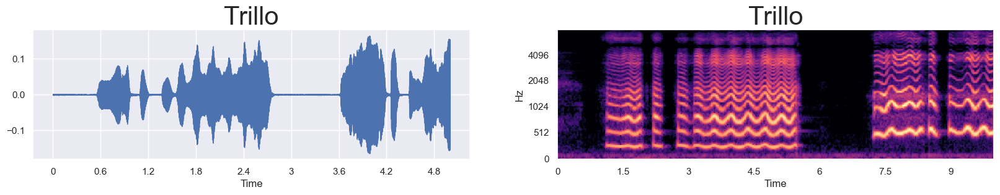

Inhaled


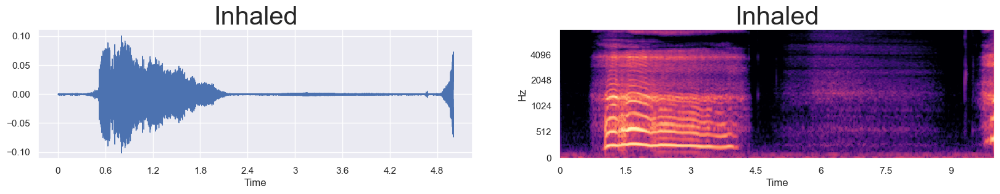

Belt


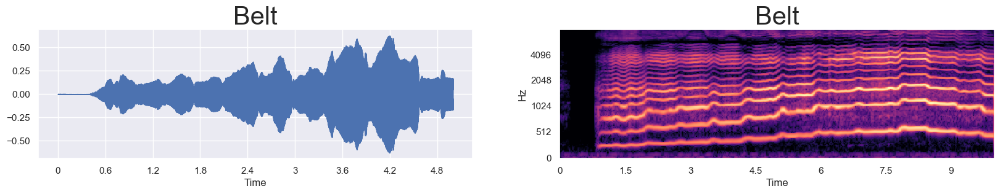

Spoken


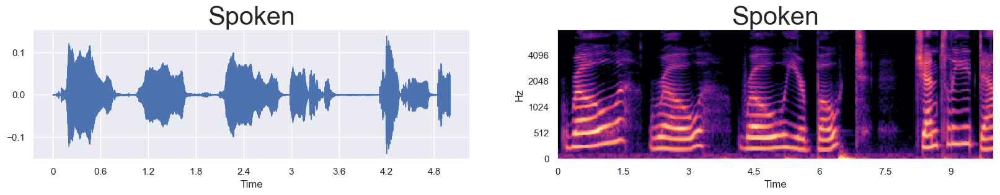

In [10]:
# Load list of sample files
file_list = ['samples/f2_scales_vibrato_a(1).wav', "samples/f2_scales_straight_e.wav", "samples/f2_scales_breathy_e.wav", "samples/f2_scales_vocal_fry_o.wav", "samples/f2_scales_lip_trill_a.wav", "samples/f2_long_trill_a.wav", "samples/f2_long_trillo_a.wav", "samples/f2_long_inhaled_a.wav", "samples/f2_scales_belt_a.wav", "samples/f2_row_spoken.wav"]
title_list = ['Vibrato', 'Straight', 'Breathy', 'Vocal Fry', 'Lip Trill', 'Trill', 'Trillo', 'Inhaled', 'Belt', 'Spoken']

num = 0
sr=44100
for f in file_list:
    
    print(title_list[num])
    plt.subplots(nrows=1, ncols=2, figsize=(20, 6))
    y, sr = librosa.load(f, duration=5, sr=sr)
    ipd.display(ipd.Audio(data=y, rate=sr))
    
    plt.subplot(2, 2, 1)
    plt.title(title_list[num], fontsize=30)
    librosa.display.waveshow(y, sr=sr)

    plt.subplot(2,2,2)
    plt.title(title_list[num], fontsize=30)
    spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    librosa.display.specshow(librosa.power_to_db(spec, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')

    plt.show()
    num+=1

### <span style="color:RoyalBlue">Escritura de señales de audio</span>

Para este caso también se puede usar la biblioteca scipy para generar un archivo de audio a partir de una señal:

In [11]:
import scipy.signal as sps

# Nueva frecuencia de muestreo
nueva_frecuencia = 8000

numero_muestras = round(len(canal_izquierdo) * float(nueva_frecuencia) / frecuencia_muestreo)
data = sps.resample(canal_izquierdo, numero_muestras)
wavfile.write("./testMonoResampled.wav", nueva_frecuencia, data.astype(np.int16))

## 2. Ejemplo de convolución, reverberación y correlación

Este ejercicio muestra cómo realizar convolución y efecto de reverberación a partir de señales de audio. Se puede ver una introducción al tema en el siguiente [link](https://www.izotope.com/en/learn/the-basics-of-convolution-in-audio-production.html), donde se describen algunos plugins que emplean convolución aplicado a audio.

La convolución es una operación matemática sobre dos funciones (f y g) que produce una tercera función ($f ∗ g$) que expresa cómo la forma de una es modificada por la otra. Se define como la integral del producto de las dos funciones después de invertir y desplazar una de ellas. La integral se evalúa para todos los valores de desplazamiento, produciendo la función de convolución [Wikipedia - convolución](https://en.wikipedia.org/wiki/Convolution). Se diferencia de la correlación cruzada ($f ⋆ g$) en que o bien f(x) o g(x) se reflejan sobre el eje y; por tanto la convolución $f ∗ g$ es una correlación cruzada de f(x) y g(-x), o entre f(-x) y g(x).

La correlación cruzada es una medida de similitud entre dos series en función del desplazamiento de una con respecto a la otra. También se conoce como producto punto deslizante o producto interno deslizante. Se suele utilizar para buscar dentro de una señal larga la presencia de una característica conocida más corta [Wikipedia - cross-correlation](https://en.wikipedia.org/wiki/Cross-correlation). 

Para correr los ejemplos un prerrequisito es contar con la biblioteca librosa. Si no la tienen instalada, desde el prompt de Anaconda hacer: conda install -c conda-forge librosa.


En primer lugar importemos algunos paquetes que serán útiles:

In [12]:
import IPython, numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib 
import sklearn 
import librosa
import cmath
import math
import IPython.display as ipd
 
%matplotlib inline

En segundo lugar definamos funciones para el cálculo de convolución y correlación cruzada

In [13]:
def convolution(A,B):
  C = np.zeros(A.size + B.size -1)
  for m in range(A.size):
    for n in range(B.size):
      C[m+n] = C[m+n] + A[m] * B[n]
  return C

def xcorrelation(A,B):
  return convolution(np.conj(A),B[::-1])

Ahora generemos algunas series temporales y analicemos la convolución

Text(0, 0.5, 'A conv B')

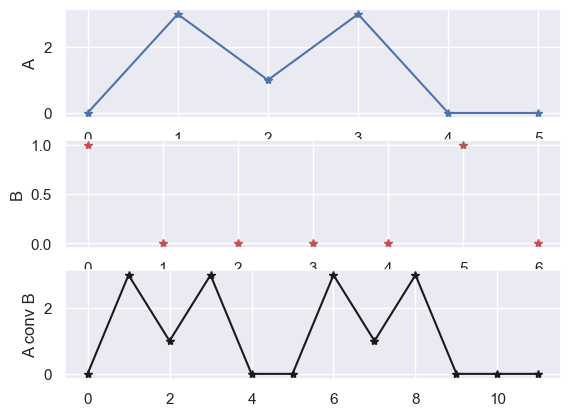

In [14]:
A =  np.array([ 0,3, 1, 3, 0, 0])
B = np.array([ 1,0, 0, 0, 0, 1, 0]) # Try messing around with changing B to see how the convolution changes

# Gráficas
plt.subplot(3,1,1)
plt.plot(A,'-*')
plt.ylabel('A')

plt.subplot(3,1,2)
plt.plot(B, 'r*')
plt.ylabel('B')

plt.subplot(3,1,3)
plt.plot(convolution(B,A), 'k-*') # Try swapping the order of B and A. Does it change the output?
plt.ylabel('A conv B')

Ahora reescribamos la convolución pero usando FFTs

In [15]:
def convolutionFFT(A,B):
  # first, figure out how long the output will need to be
  conv_length = A.size + B.size -1

  # now...ffts work better if we pad to a power of 2
  padded_length = int(2**np.ceil(np.log2(conv_length)))

  # now take the fft of both signals
  Afft = sp.fft.fft(A,padded_length)
  Bfft = sp.fft.fft(B,padded_length)
  
  # multiply element-wise and do the inverse FFT 
  C = np.real(sp.fftpack.ifft(Afft*Bfft))
  
  # trim to the appropriate length
  C = C[0:conv_length]
  return C

def xcorrelationFFT(A,B):
  return convolutionFFT(np.conj(A),B[::-1])

Comparemos las salidas usando ambas versiones de las funciones de convolución:

Text(0, 0.5, 'freq-domain')

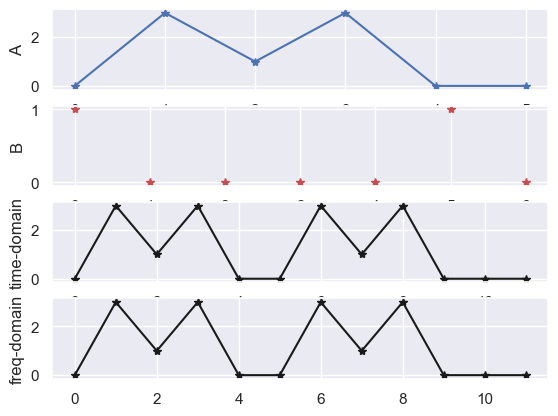

In [16]:
# Plot them
plt.subplot(4,1,1)
plt.plot(A,'-*')
plt.ylabel('A')

plt.subplot(4,1,2)
plt.plot(B, 'r*')
plt.ylabel('B')

plt.subplot(4,1,3)
plt.plot(convolution(A,B), 'k-*')
plt.ylabel('time-domain')

plt.subplot(4,1,4)
plt.plot(convolutionFFT(A,B), 'k-*')
plt.ylabel('freq-domain')


### Generación de reverberación

Para simular reverberaciones vamos a usar la grabación de unas palmas y una trompeta en los archivos "clap.wav" y "trumpet.wav".

In [17]:
# Carga grabación del aplauso
archivo_entrada = './clap.wav'
clap,sample_rate = librosa.load(archivo_entrada, sr=8000) # Remuestrea la señal original a 8 kHz
ipd.display(ipd.Audio(clap, rate=sample_rate))
print('Aplauso en una sala \n')

# Carga grabación de trompeta
archivo_entrada = './trumpet.wav'
trumpet_dry,sample_rate = librosa.load(archivo_entrada, sr=8000)
ipd.display(ipd.Audio(trumpet_dry, rate=sample_rate))
print('Trompeta sin eco \n')


# Definición de la reverberación
# Se genera una función de respuesta al impulso que genera
#an echo a 1/2 segundo y otro a 1 segundo
artificial_impulse_response = np.zeros(8000)
artificial_impulse_response[0]= 1
artificial_impulse_response[4000]= .5
artificial_impulse_response[7999]= .25

# Generación de las señales procesada usando convolución con el aplauso
trumpet_wet = convolutionFFT(trumpet_dry, clap)
ipd.display(ipd.Audio(data=trumpet_wet, rate=8000))
print('Trompeta en la habitación donde se aplaudió \n')

# Generación de las sñales con reverberación usando la respuesta al impulso artificial
trumpet_wet2 = convolutionFFT(trumpet_dry,artificial_impulse_response)
ipd.display(ipd.Audio(data=trumpet_wet2, rate=8000))
print('Trompeta con la respuesta al impulso artificial')


Aplauso en una sala 



Trompeta sin eco 



Trompeta en la habitación donde se aplaudió 



Trompeta con la respuesta al impulso artificial


### Determinación del pitch

Ahora tratemos de identificar la altura tonal de las notas usando la función de autocorrelación:

Text(0.5, 1.0, 'Autocorrelación de la primera nota de trompeta')

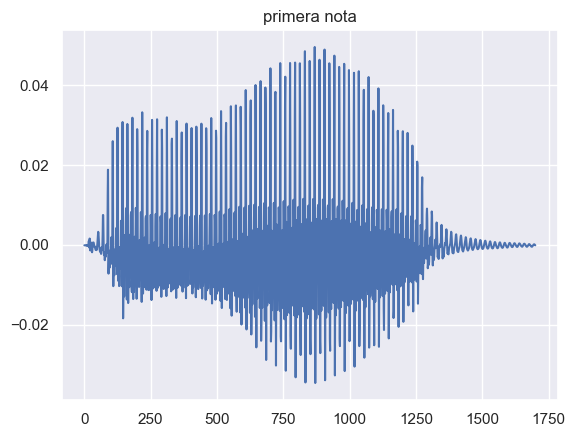

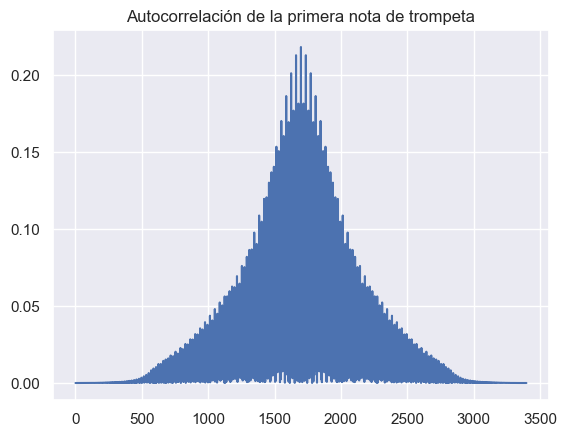

In [18]:
# Primero obtengamos la primera nota de la grabación de la trompeta
first_note = trumpet_dry[3300:5000]
plt.plot(first_note)
plt.title('primera nota')
ipd.display(ipd.Audio(first_note, rate=8000))

# La autocorrelación se puede obtener calculando la correlación cruzada de la señal consigo misma_
ac = xcorrelationFFT(first_note,first_note)
ac = np.abs(ac)

# Grafiquemos la autocorrelación
plt.figure()
plt.plot(ac)
plt.title('Autocorrelación de la primera nota de trompeta')

Si hacemos zoom a la parte de la figura de autocorrelación:

Text(0.5, 1.0, 'Zoom sobre la autocorrelación de la primera nota de trompeta')

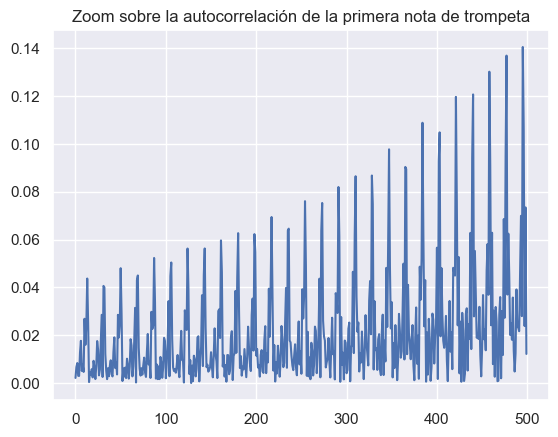

In [19]:

# let's zoom in on part of the autocorrelation figure
plt.figure()
plt.plot(ac[1000:1500])
plt.title('Zoom sobre la autocorrelación de la primera nota de trompeta')

Y aumentemos el zoom:

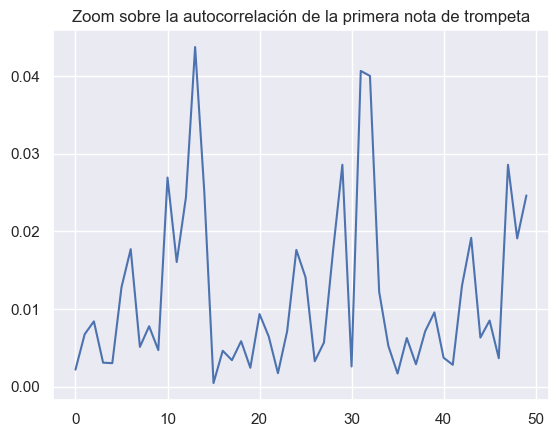

In [20]:
# let's zoom in further
plt.figure()
plt.title('Zoom sobre la autocorrelación de la primera nota de trompeta')
plt.plot(ac[1000:1050])

La distancia promedio entre los picos es igual al período de repetición en muestras. Supongamos que en este caso el promedio sea igual al ejemplo que vemos: $31-12=19$ 

Si se divide la frecuencia de muestreo por ese valor se obtiene una estimación del pitch!
$f_0 = 8000/19 = 421 Hz$ 


Si vemos una tabla de afinación para el piano por [ejemplo](https://es.wikipedia.org/wiki/Frecuencias_de_afinaci%C3%B3n_del_piano). La nota más cercana está en 415 Hz y corresponde a sol sostenido.

## 3. Librerías adicionales para manipulación de audio

Se pueden encontrar muchas y muy diversas bibliotecas y paquetes disponibles para trabajar con audio. A continuación hay una lista de las más conocidas:

* [pedalboard:](https://github.com/spotify/pedalboard) biblioteca de Python para añadir efectos al audio. Desarrollada por el Audio Intelligence Lab de Spotify. Objetivo: permitir el uso de efectos de audio con calidad de estudio desde Python y TensorFlow.
* [pyAudioAnalysis:](https://github.com/tyiannak/pyAudioAnalysis) biblioteca de Python para la extracción de características de audio, clasificación, segmentación y aplicaciones
* [ffmpeg-python:](https://github.com/kkroening/ffmpeg-python) wrapper Python para FFmpeg, conjunto de bibliotecas y programas para el manejo de archivos y flujos de vídeo, audio y otros archivos multimedia
* [pysox:](https://github.com/rabitt/pysox) wrapper en Python para sox, funciones para manipulación de audio
* [babycat:](https://github.com/babycat-io/babycat) biblioteca de decodificación y manipulación de audio
* [madmom](https://github.com/CPJKU/madmom) biblioteca de procesamiento de señales de audio con enfoque hacia  recuperación de información musical (MIR).
* [brian2hears](https://brian2hears.readthedocs.io/en/stable/) biblioteca de modelado auditivo para Python